In [4]:
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import matplotlib.patches as patches
from skimage.measure import label, regionprops, regionprops_table
import pandas as pd
import cv2

Определение связанных областей `numpy` массива может быть реализовано с помощью функции `label`. 
На вход функции подаётся бинарное изображение представленное в виде `numpy` массива. Пример:

In [3]:
# загружаем RGB изображение
img = plt.imread('Test_Image.png')
plt.figure(figsize=(15,15))
plt.imshow(img)

FileNotFoundError: [Errno 2] No such file or directory: 'Test_Image.png'

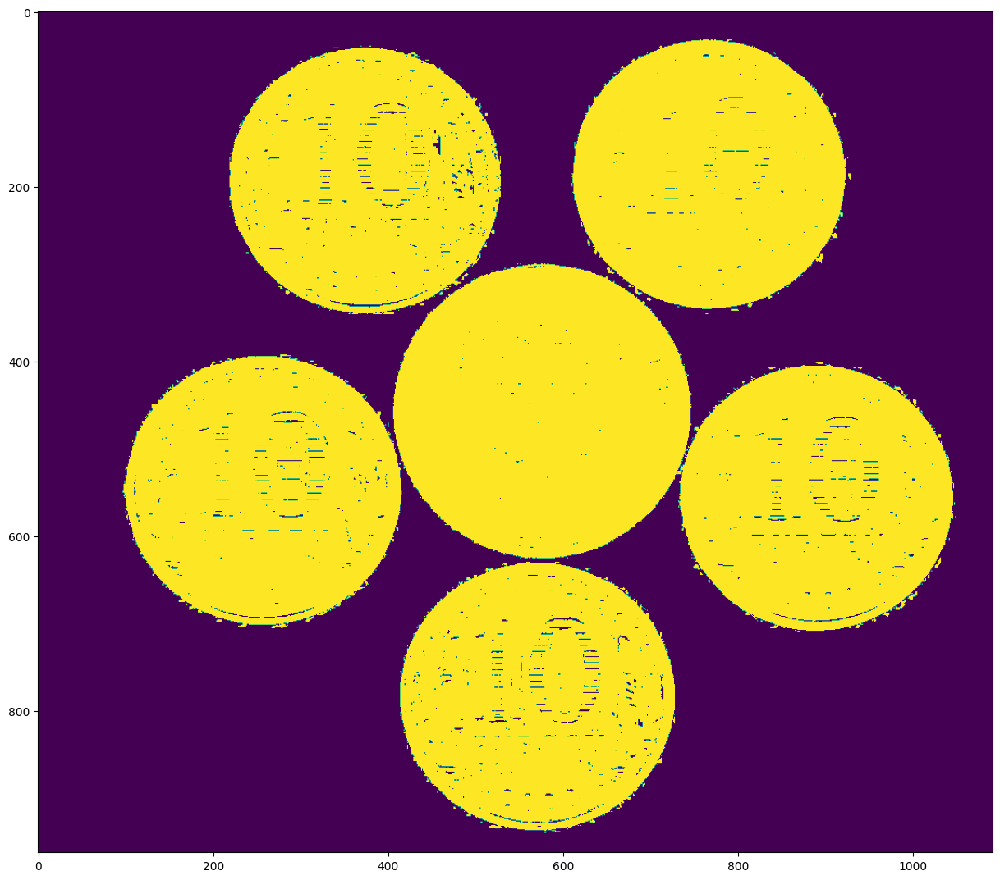

In [ ]:
# бинаризируем изображение
test_img = np.where(img[:,:,0]<0.99, 1, 0)
plt.figure(figsize=(15,15))
plt.imshow(test_img)

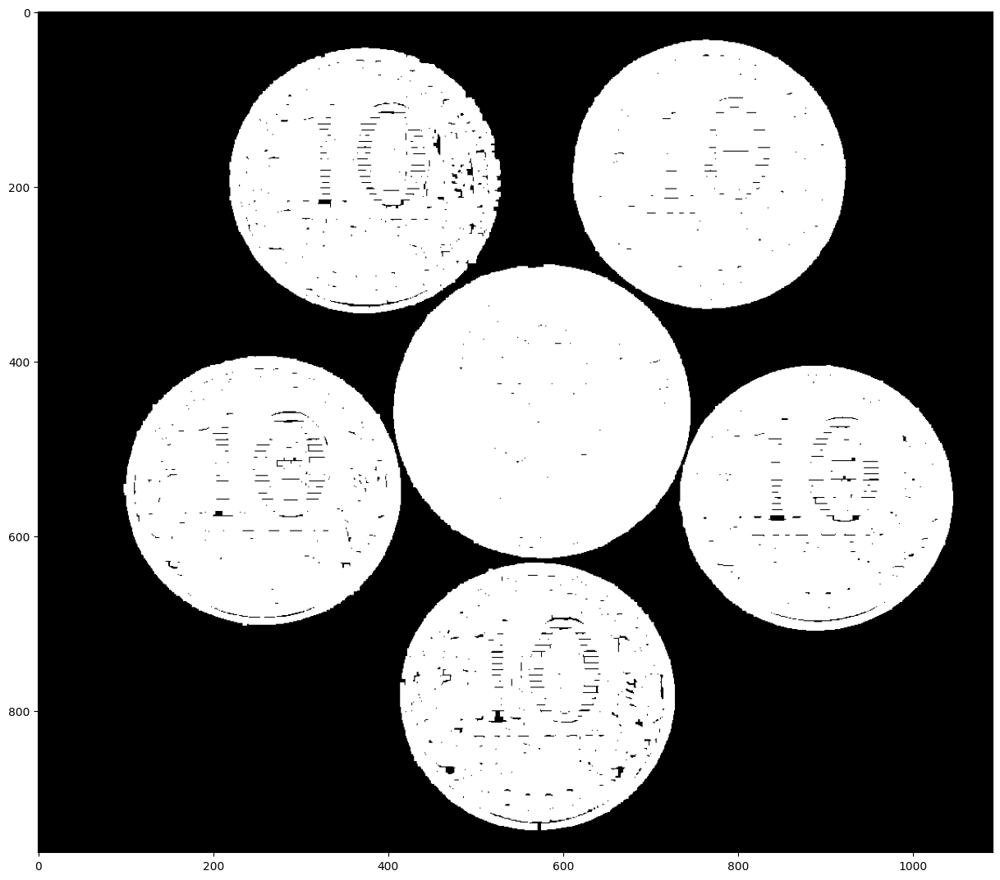

In [ ]:
# выделяем более точные сегменты с помощью морфологических операций

# преобразуем изображение из numpy массива в бинарное изображение PIL
test_img = Image.fromarray((test_img*255).astype(np.uint8)).convert('1') 
# применим операцию сужения
test_img = test_img.filter(ImageFilter.MinFilter(5)) #

# применим операцию расширения
test_img = test_img.filter(ImageFilter.MaxFilter(5)) #

plt.figure(figsize=(15,15))
plt.imshow(test_img)

In [ ]:
# полученное изображение снова преобразуем в массив numpy
test_img = np.array(test_img)
print(f'Изображение представленно в виде - {type(test_img)}')

# определяем связные области
label_im = label(test_img)

Изображение представленно в виде - <class 'numpy.ndarray'>


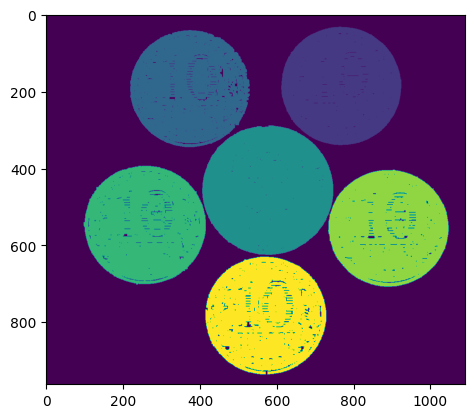

In [ ]:
# при визуализации каждая связная область представленна уникальным цветом
plt.imshow(label_im)

В полученном массиве `label_im` элементам каждой связной области присвоены значения соответствующие номеру области, которой они принадлежат. Например, все элементы области помеченной жёлтым цветом на изображении выше представляют собой значение 1, элементы зелённой области - значение 2, синей - 3, и так далее.  Далее используя функцию `regionprops`, которая формирует описание каждой связной области. На вход функции подаётся результат полученный с помощью функции `label`. После чего можно получить доступ к свойствам связных областей через следующие атрибуты (ключи):

`area` - Количество пикселей принадлижащих области.

`bbox` - Ограничительная рамка (min_row, min_col, max_row, max_col) . Пиксели, принадлежащие ограничивающей рамке, находятся в полуоткрытом интервале [min_row; max_row) и [min_col; max_col). (row - строка, col - столбец, представляют собой координаты пикселя в массиве).

`bbox_area` - Количество пикселей принадлижащих ограничивающей рамке.

`centroid` - Кортеж координат центра области (row, col).

`local_centroid` - Кортеж координат центра тяжести (row, col) относительно ограничивающей рамки области.

`equivalent_diameter` - Диаметр круга с той же площадью, что и у связной области.

`extent` - Отношение количества пикселей в связной области к количеству пикселей в соответствующей данной области ограничивающей рамке. Вычисляется как area / (rows * cols).

`label` - Метка в помеченном входном изображении.

`filled_image` - Бинарное изображение такого же размера, что и ограничивающая рамка, которое содержит связную область с заполненными отверстиями.

`image` -Бинарное изображение такого же размера, что и ограничивающая рамка, которое содержит связную область.

`intensity_image` - Срез изображения размером ограничивающей рамки, в котором отображены пиксели попадающие в связную область внутри ограничивающей рамки области. Для получения данного атрибута на вход функции `regionprops` также подаётся исходное изображение.


In [ ]:
regions = regionprops(np.repeat(label_im[..., None], 3, axis=2), img)  # если необходимы такие арибуты как intensity_image
# в ином случае regions = regionprops(label_im)

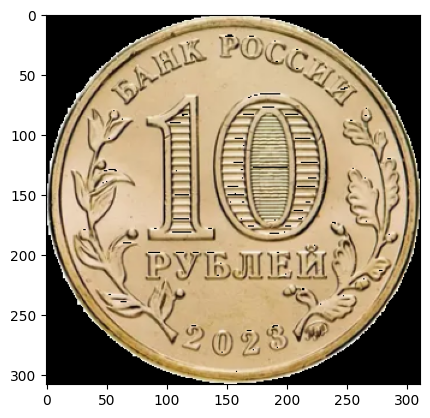

In [ ]:
plt.imshow(regions[0].intensity_image)

In [ ]:
# пример формирования списка координат рамок всех объектов на изображении
bbox = []
for x in regions:
    bbox.append(x.bbox)   
count = len(bbox)
count

6

In [ ]:
bbox

[(33, 611, 0, 341, 923, 3),
 (42, 219, 0, 346, 529, 3),
 (290, 406, 0, 626, 746, 3),
 (395, 98, 0, 703, 415, 3),
 (405, 733, 0, 709, 1046, 3),
 (631, 414, 0, 937, 728, 3)]

Используя функцию `regionprops_table`, можно извлечь и информативно отобразить необходимые особенности и свойства для каждой связной области из идентифицированных. Пример:

In [ ]:
# формируем список необходимых свойств связных областей
properties = ['label', 'area', 'bbox_area', 'extent']
# преобразуем выбранные свойства в dataframe pandas
pd.DataFrame(regionprops_table(label_im, img.mean(2), properties=properties))

,label,area,bbox_area,extent
0,1,74837.0,96096.0,0.778773
1,2,71926.0,94240.0,0.763222
2,3,89483.0,114240.0,0.783290
3,4,74965.0,97636.0,0.767801
4,5,73058.0,95152.0,0.767803
5,6,73494.0,96084.0,0.764893


Ниже представлен один из вариантов отображения на исходном изображении найденных ограничивающих рамок:

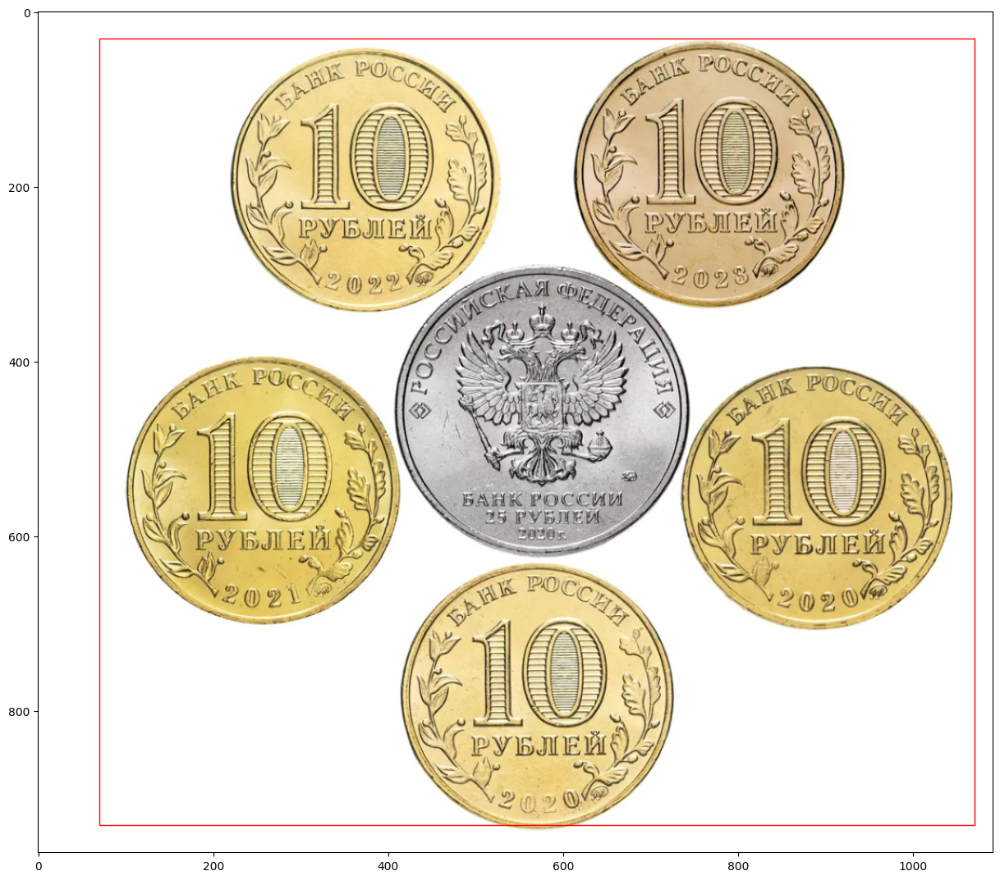

In [ ]:
#отображаем исходное изображение
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(img)
#формируем ограничивающую рамку по координатам шириной в один пиксель, красного цвета, не закрашивая содержимое рамки.
# на вход функции patches.Rectangle подаются координаты (x,y) верхнего левого угла рамки, а также её ширина и длина.
rect = patches.Rectangle(xy=(70, 30), width=1000, height=900, linewidth=1, edgecolor='r', facecolor='none')
#добавляем к рисунком рамку
ax.add_patch(rect)
#отображаем получившийся рисунок
plt.show()

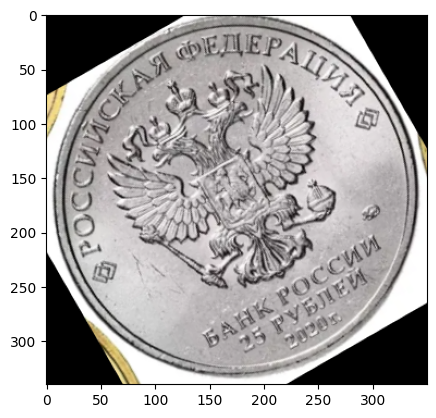

In [ ]:
# подготовим шаблонное изображение, повернём его и преобразуем в оттенки серого
template = (img[290:630, 400:750]*255).astype(np.uint8)

# Поворот изображения
num_rows, num_cols = template.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
template = cv2.warpAffine(template, rotation_matrix, (num_cols, num_rows))

template_gray = cv2.cvtColor(template, cv2.COLOR_RGB2GRAY) # преобразуем в оттенки серого
plt.imshow(template)

#подготовим тестовое изображение 
test_image = (img*255).astype(np.uint8)
test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)


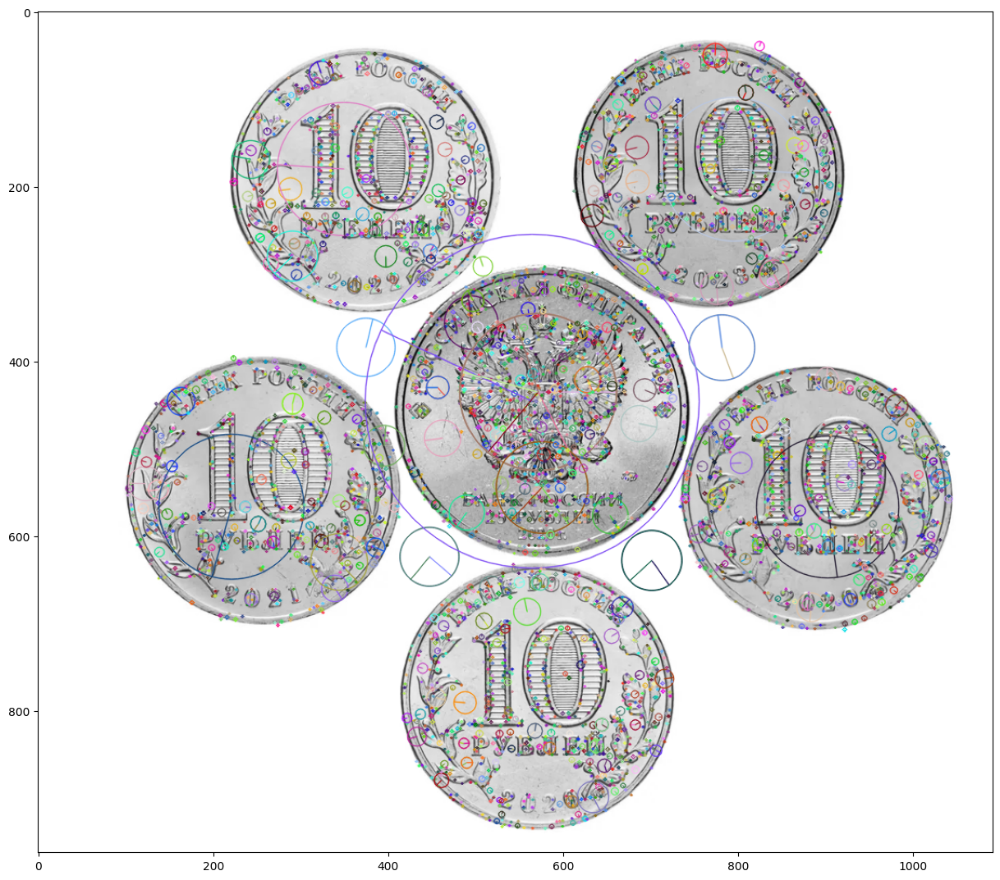

In [ ]:
#далее определяем ключевые (характеризующие) точки на изображении
#sift = cv2.xfeatures2d.SIFT_create()
sift = cv2.SIFT_create() # Создаём объект класса для метода нахождения ключевых точек

train_keypoints, train_descriptor = sift.detectAndCompute(template_gray, None)  # находим ключевые точки на шаблонном изображении
test_keypoints, test_descriptor = sift.detectAndCompute(test_gray, None)  # находим ключевые точки на тестовом изображении
#отобразим ключевые точки на тестовом изображении
keypoints_with_size = np.copy(test_image)
cv2.drawKeypoints(test_gray, test_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(15,15))
plt.imshow(keypoints_with_size);

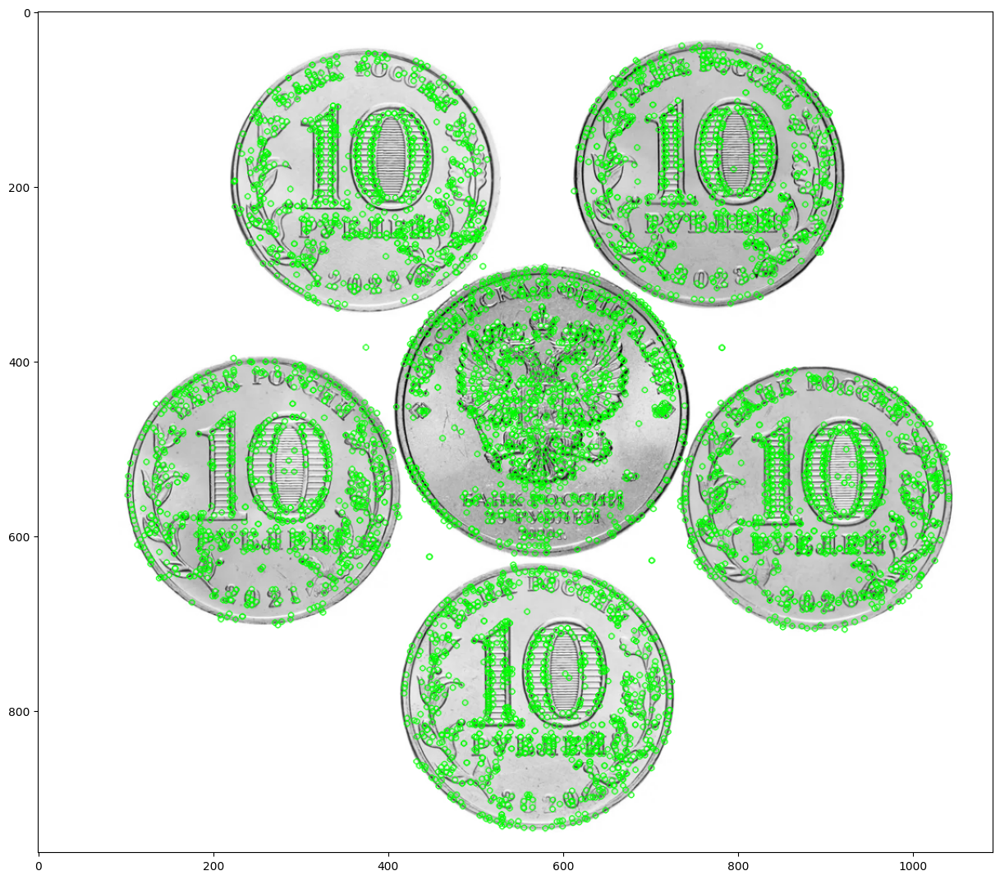

In [ ]:
#для большей наглядности отобразим ключевые точки без учёта их размера 
keypoints_without_size = np.copy(test_image)
cv2.drawKeypoints(test_gray, test_keypoints, keypoints_without_size, color = (0, 255, 0))
plt.figure(figsize=(15,15))
plt.imshow(keypoints_without_size);

In [ ]:
#посмотрим количество сформированных ключевых точек на шаблонном и тестовом изображении
print("Кодличество ключевых точек, сформированных на шаблонном изображении: ", len(train_keypoints))
print("Кодличество ключевых точек, сформированных на тестовом изображении: ", len(test_keypoints))

Кодличество ключевых точек, сформированных на шаблонном изображении:  1657
Кодличество ключевых точек, сформированных на тестовом изображении:  6212


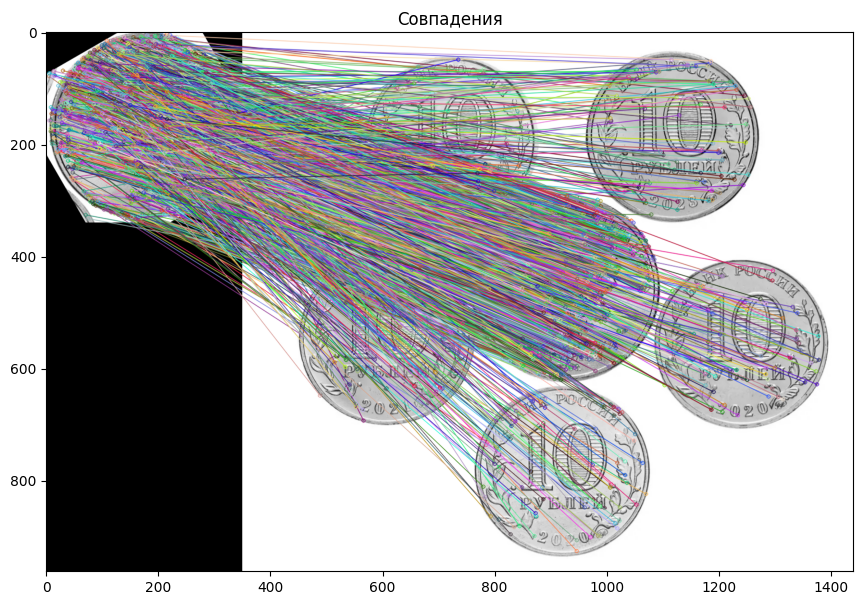


Количество совпадений точек между тестовым и шаблонным изображением:  1657


In [ ]:
#сравним тестовое и шаблонное изображение по ключевым точкам
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)
matches = bf.match(train_descriptor, test_descriptor)
matches = sorted(matches, key = lambda x : x.distance)
result = cv2.drawMatches(template_gray, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)
#визуализируем результат сравнения
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Совпадения')
plt.imshow(result)
plt.show()
print("\nКоличество совпадений точек между тестовым и шаблонным изображением: ", len(matches))

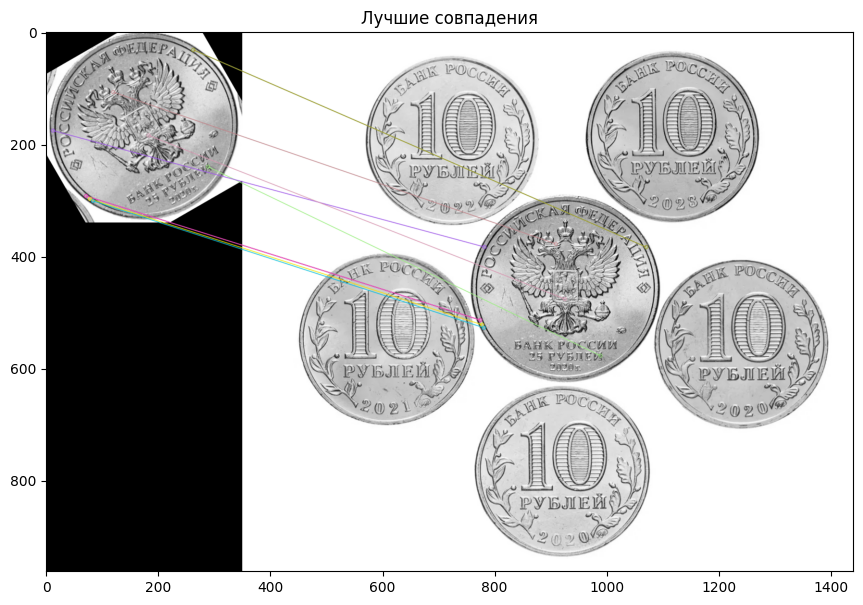

In [ ]:
#отобразим 10 лучших совпадений
result = cv2.drawMatches(template_gray, train_keypoints, test_gray, test_keypoints, matches[:10], test_gray, flags = 2)
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Лучшие совпадения')
plt.imshow(result)
plt.show()

**Задание 1**

Написать программу, которая принимает на вход изображение дорожной сцены, находит координаты ограничивающих рамок для каждого объекта синего цвета на изображении, после чего каждая область принадлижащая сформированной ограничивающей рамке сравнивается с шаблоном с помощью метода `SIFT`. Результирующее изображение представляет собой исходное изображение с наложенными ограничивающими рамками вокруг тех объектов, которые имеют максимальную схожесть с шаблоном. 

**Исходное изображение**

<img src="https://sun9-20.userapi.com/impg/IxBYh7Zq7AMwY3IkKNg84ZnPqgInjG8aKlHdfg/deh2-hEYkgA.jpg?size=1913x1076&quality=96&sign=2a6533721d27019354edd447aaab08b7&type=album" title="Исходное изображение"/>

**Шаблон**

<img src="template.jpg" title="Шаблон"/>

**Результирующее изображение**

<img src="https://sun9-79.userapi.com/impg/bmRqVsJPYqivHhm3Maa93YKBDCD4caqKdUA9bg/eipUdfEbWCU.jpg?size=883x505&quality=96&sign=3377cf455741594a8ee1972dfb731d51&type=album" title="Результирующее изображение"/>

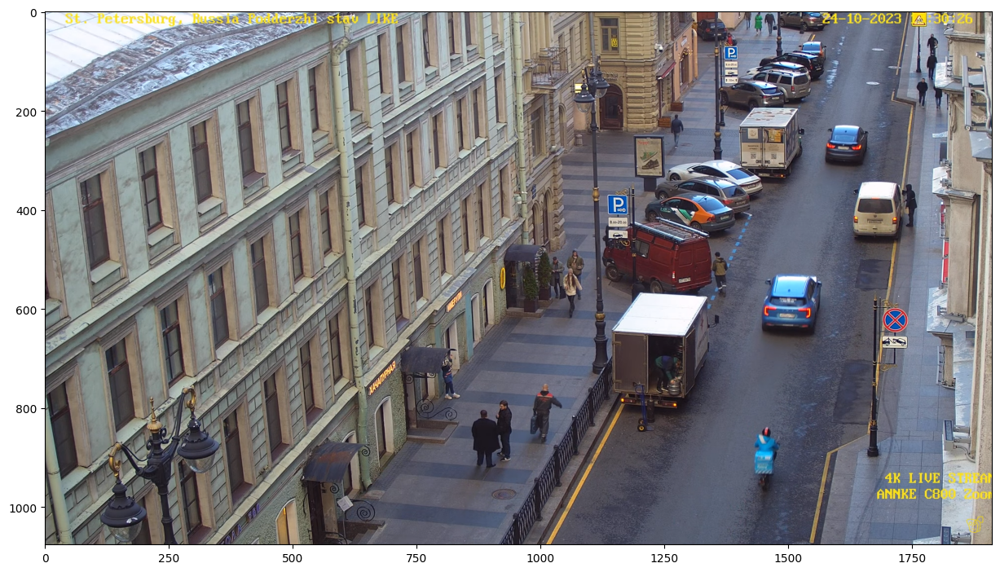

In [ ]:
# загружаем RGB изображение
img1 = plt.imread('SP_1.png')
plt.figure(figsize=(15,15))
plt.imshow(img1)

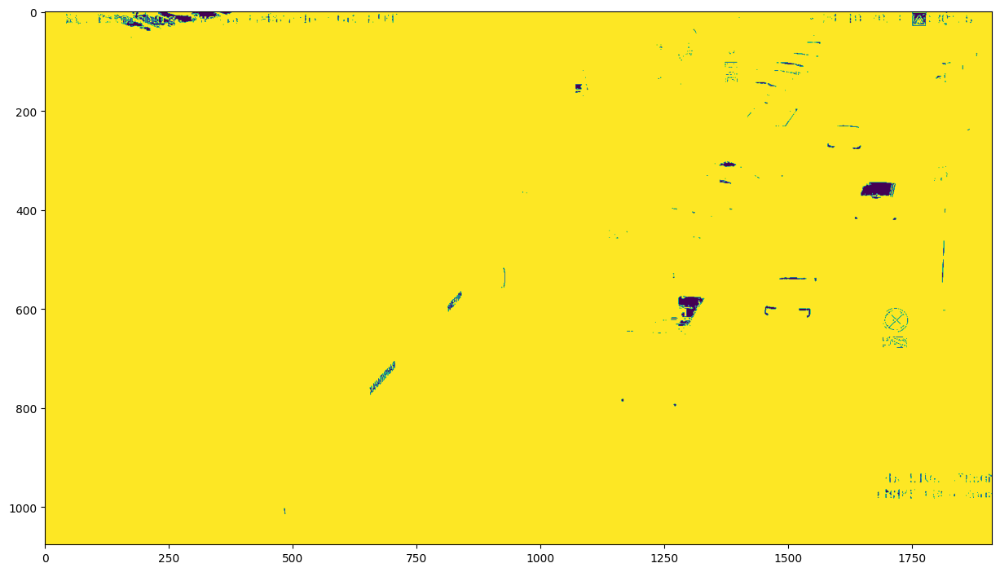

In [7]:
# бинаризируем изображение
test_img1 = np.where(img1[:,:,0]<0.99, 1, 0)
plt.figure(figsize=(15,15))
plt.imshow(test_img1)

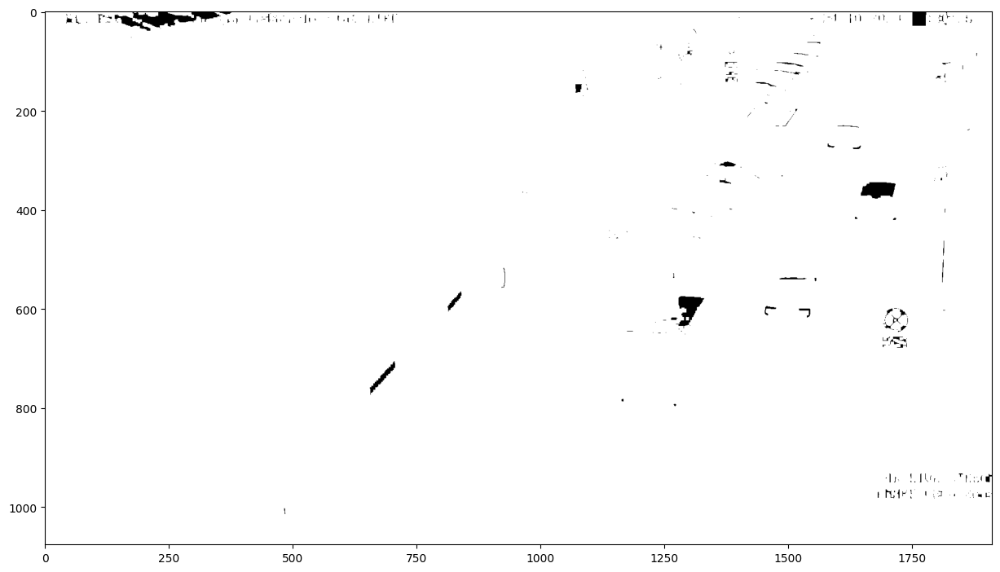

In [8]:
# выделяем более точные сегменты с помощью морфологических операций

# преобразуем изображение из numpy массива в бинарное изображение PIL
test_img1 = Image.fromarray((test_img1*255).astype(np.uint8)).convert('1') 
# применим операцию сужения
test_img1 = test_img1.filter(ImageFilter.MinFilter(5)) #

# применим операцию расширения
test_img1 = test_img1.filter(ImageFilter.MaxFilter(5)) #

plt.figure(figsize=(15,15))
plt.imshow(test_img1)

In [9]:
# полученное изображение снова преобразуем в массив numpy
test_img1 = np.array(test_img1)
print(f'Изображение представленно в виде - {type(test_img1)}')

# определяем связные области
label_im1 = label(test_img1)

Изображение представленно в виде - <class 'numpy.ndarray'>


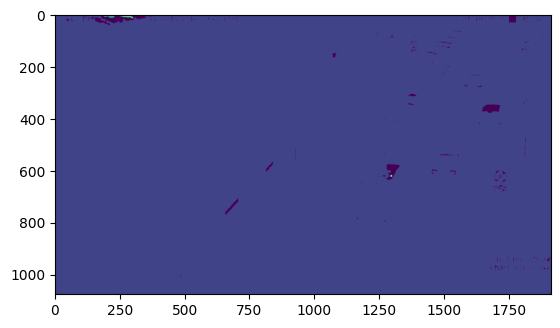

In [10]:
# при визуализации каждая связная область представленна уникальным цветом
plt.imshow(label_im1)

In [11]:
regions1 = regionprops(np.repeat(label_im1[..., None], 3, axis=2), img1)  # если необходимы такие арибуты как intensity_image
# в ином случае regions = regionprops(label_im)

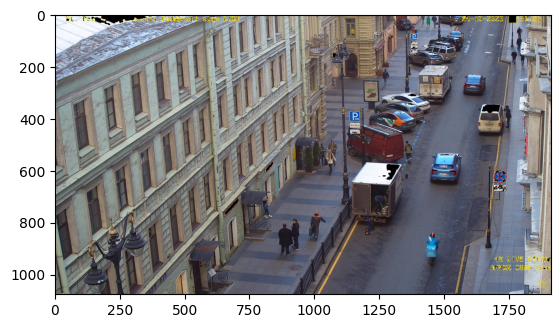

In [12]:
plt.imshow(regions1[0].intensity_image)

In [13]:
# пример формирования списка координат рамок всех объектов на изображении
bbox1 = []
for x in regions1:
    bbox1.append(x.bbox)   
count = len(bbox1)
count

5

In [14]:
bbox1

[(0, 0, 0, 1076, 1913, 3),
 (0, 180, 0, 3, 185, 3),
 (0, 188, 0, 11, 229, 3),
 (0, 248, 0, 13, 301, 3),
 (617, 1294, 0, 624, 1300, 3)]

Используя функцию `regionprops_table`, можно извлечь и информативно отобразить необходимые особенности и свойства для каждой связной области из идентифицированных. Пример:

In [15]:
# формируем список необходимых свойств связных областей
properties1 = ['label', 'area', 'bbox_area', 'extent']
# преобразуем выбранные свойства в dataframe pandas
pd.DataFrame(regionprops_table(label_im1, img1.mean(2), properties=properties1))

,label,area,bbox_area,extent
0,1,2044232,2058388,0.993123
1,2,15,15,1.000000
2,3,336,451,0.745011
3,4,397,689,0.576197
4,5,42,42,1.000000


Ниже представлен один из вариантов отображения на исходном изображении найденных ограничивающих рамок:

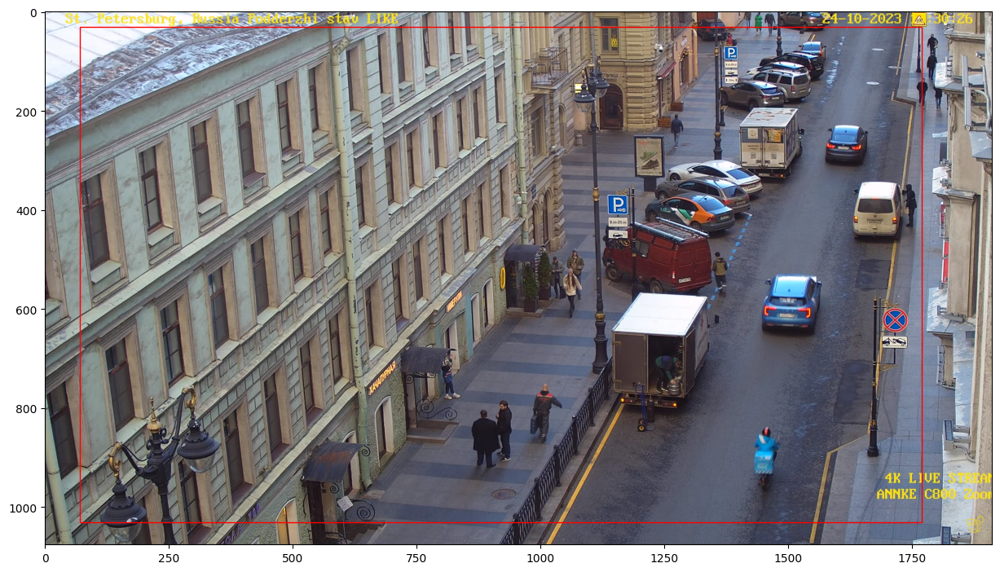

In [16]:
#отображаем исходное изображение
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(img1)
#формируем ограничивающую рамку по координатам шириной в один пиксель, красного цвета, не закрашивая содержимое рамки.
# на вход функции patches.Rectangle подаются координаты (x,y) верхнего левого угла рамки, а также её ширина и длина.
rect = patches.Rectangle(xy=(70, 30), width=1700, height=1000, linewidth=1, edgecolor='r', facecolor='none')
#добавляем к рисунком рамку
ax.add_patch(rect)
#отображаем получившийся рисунок
plt.show()

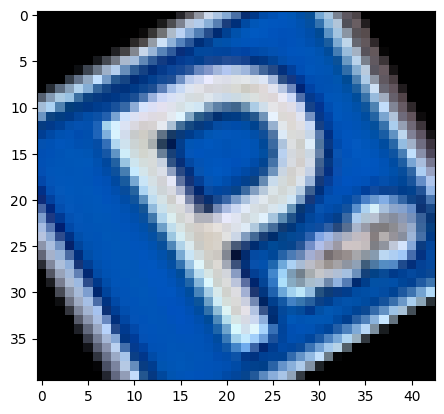

In [17]:
# подготовим шаблонное изображение, повернём его и преобразуем в оттенки серого
template1 = (img1[370:410, 1135:1178]*255).astype(np.uint8)

# Поворот изображения
num_rows, num_cols = template1.shape[:2]
rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
template1 = cv2.warpAffine(template1, rotation_matrix, (num_cols, num_rows))

template_gray1 = cv2.cvtColor(template1, cv2.COLOR_RGB2GRAY) # преобразуем в оттенки серого
plt.imshow(template1)

#подготовим тестовое изображение 
test_image1 = (img1*255).astype(np.uint8)
test_gray1 = cv2.cvtColor(test_image1, cv2.COLOR_RGB2GRAY)


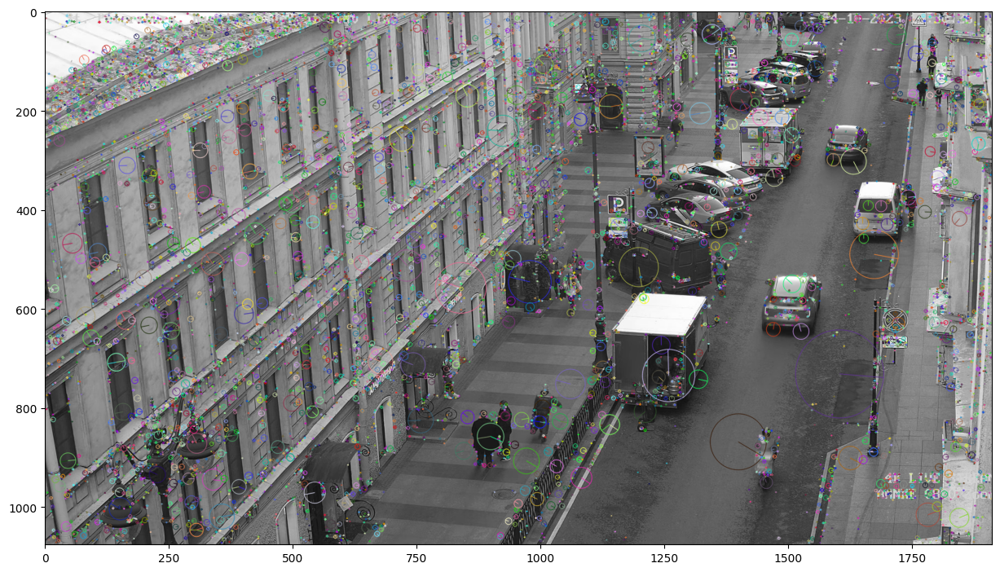

In [18]:
#далее определяем ключевые (характеризующие) точки на изображении
#sift = cv2.xfeatures2d.SIFT_create()
sift = cv2.SIFT_create() # Создаём объект класса для метода нахождения ключевых точек

train_keypoints, train_descriptor = sift.detectAndCompute(template_gray1, None)  # находим ключевые точки на шаблонном изображении
test_keypoints, test_descriptor = sift.detectAndCompute(test_gray1, None)  # находим ключевые точки на тестовом изображении
#отобразим ключевые точки на тестовом изображении
keypoints_with_size = np.copy(test_image1)
cv2.drawKeypoints(test_gray1, test_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(15,15))
plt.imshow(keypoints_with_size)

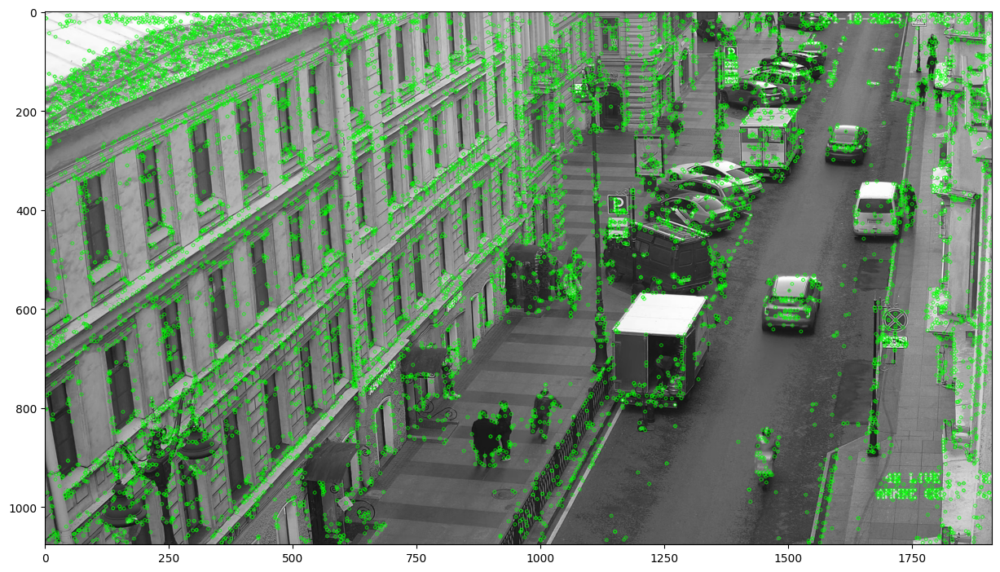

In [19]:
#для большей наглядности отобразим ключевые точки без учёта их размера 
keypoints_without_size = np.copy(test_image1)
cv2.drawKeypoints(test_gray1, test_keypoints, keypoints_without_size, color = (0, 255, 0))
plt.figure(figsize=(15,15))
plt.imshow(keypoints_without_size)

In [20]:
#посмотрим количество сформированных ключевых точек на шаблонном и тестовом изображении
print("Кодличество ключевых точек, сформированных на шаблонном изображении: ", len(train_keypoints))
print("Кодличество ключевых точек, сформированных на тестовом изображении: ", len(test_keypoints))

Кодличество ключевых точек, сформированных на шаблонном изображении:  18
Кодличество ключевых точек, сформированных на тестовом изображении:  10861


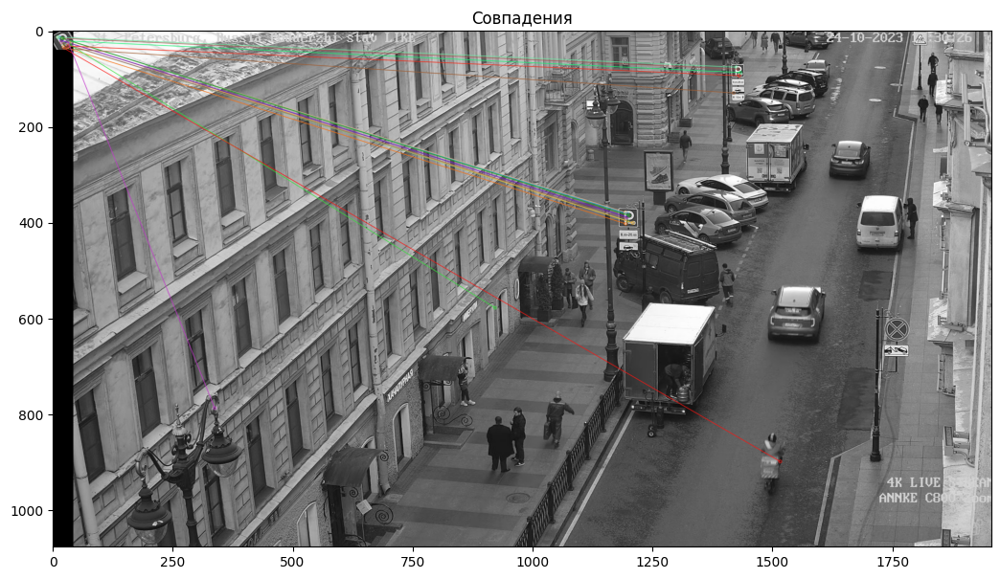


Количество совпадений точек между тестовым и шаблонным изображением:  18


In [21]:
#сравним тестовое и шаблонное изображение по ключевым точкам
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)
matches = bf.match(train_descriptor, test_descriptor)
matches = sorted(matches, key = lambda x : x.distance)
result = cv2.drawMatches(template_gray1, train_keypoints, test_gray1, test_keypoints, matches, test_gray1, flags = 2)
#визуализируем результат сравнения
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Совпадения')
plt.imshow(result)
plt.show()
print("\nКоличество совпадений точек между тестовым и шаблонным изображением: ", len(matches))

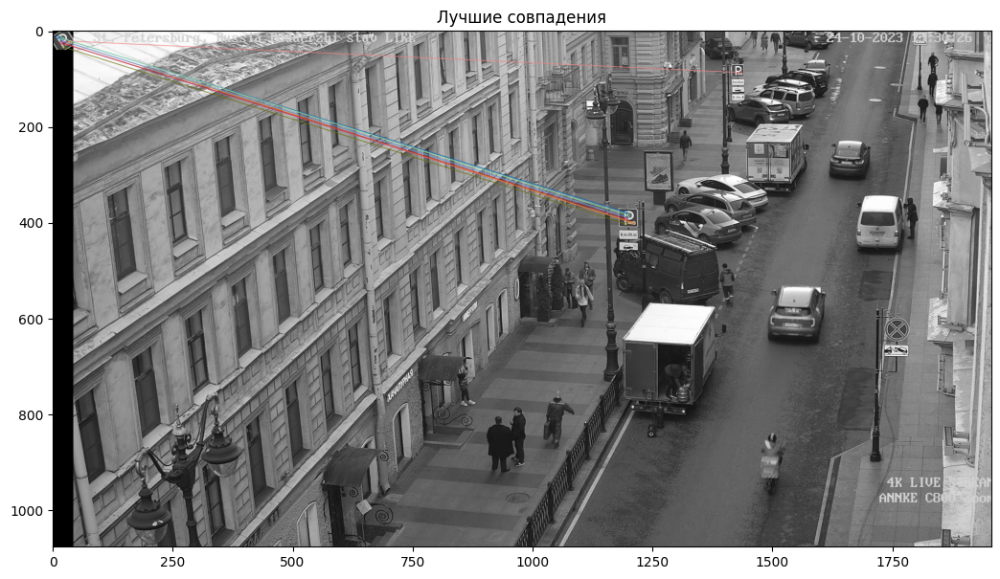

In [22]:
#отобразим 10 лучших совпадений
result = cv2.drawMatches(template_gray1, train_keypoints, test_gray1, test_keypoints, matches[:10], test_gray1, flags = 2)
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Лучшие совпадения')
plt.imshow(result)
plt.show()